Code for **"Blind restoration of a JPEG-compressed image"** and **"Blind image denoising"** figures. Select `fname` below to switch between the two.

- To see overfitting set `num_iter` to a large value.

In [ ]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
!git clone https://github.com/DmitryUlyanov/deep-image-prior
!mv deep-image-prior/* ./

fatal: destination path 'deep-image-prior' already exists and is not an empty directory.
mv: cannot stat 'deep-image-prior/*': No such file or directory


In [ ]:
from tensorflow.python.client import device_lib 
device_lib.list_local_devices()


[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 18258751633131050595
 xla_global_id: -1, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 16154099712
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 655380685825557184
 physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"
 xla_global_id: 416903419]

# Import libs

In [ ]:
from __future__ import print_function
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'

import numpy as np
from models import *

import time

import torch
import torch.optim

from skimage.metrics import peak_signal_noise_ratio
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

random_seed = 545
torch.manual_seed(random_seed)

In [ ]:
# deJPEG 
# fname = 'data/denoising/snail.jpg'

## denoising
fname = 'data/denoising/F16_GT.png'

# Load image

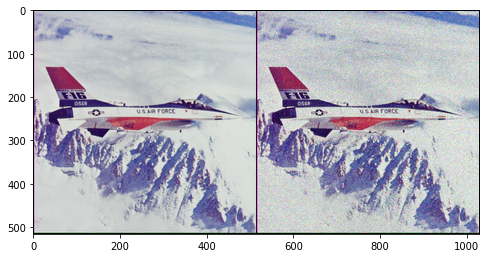

In [ ]:
if fname == 'data/denoising/snail.jpg':
    img_noisy_pil = crop_image(get_image(fname, imsize)[0], d=32)
    img_noisy_np = pil_to_np(img_noisy_pil)
    
    # As we don't have ground truth
    img_pil = img_noisy_pil
    img_np = img_noisy_np
    
    if PLOT:
        plot_image_grid([img_np], 4, 5);
        
elif fname == 'data/denoising/F16_GT.png':
    # Add synthetic noise
    img_pil = crop_image(get_image(fname, imsize)[0], d=32)
    img_np = pil_to_np(img_pil)
    
    img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)
    img_noisy_pil.save("noisy_F16.png")
    
    if PLOT:
        plot_image_grid([img_np, img_noisy_np], 4, 6);
else:
    assert False

# Setup

In [ ]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

if fname == 'data/denoising/snail.jpg':
    num_iter = 2400
    input_depth = 3
    figsize = 5 
    
    net = skip(
                input_depth, 3, 
                num_channels_down = [8, 16, 32, 64, 128], 
                num_channels_up   = [8, 16, 32, 64, 128],
                num_channels_skip = [0, 0, 0, 4, 4], 
                upsample_mode='bilinear',
                need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU')

    net = net.type(dtype)

elif fname == 'data/denoising/F16_GT.png':
    num_iter = 3001
    input_depth = 32 
    figsize = 4 
    
    
    net = get_net(input_depth, 'skip', pad,
                  skip_n33d=128, 
                  skip_n33u=128, 
                  skip_n11=4, 
                  num_scales=5,
                  upsample_mode='bilinear').type(dtype)

else:
    assert False
    
net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 2217831


# Optimize

tensor([[[[0.0676, 0.0271, 0.0858,  ..., 0.0395, 0.0633, 0.0855],
          [0.0762, 0.0239, 0.0455,  ..., 0.0500, 0.0584, 0.0787],
          [0.0696, 0.0188, 0.0700,  ..., 0.0052, 0.0281, 0.0382],
          ...,
          [0.0146, 0.0905, 0.0857,  ..., 0.0309, 0.0356, 0.0733],
          [0.0166, 0.0760, 0.0655,  ..., 0.0198, 0.0534, 0.0512],
          [0.0921, 0.0291, 0.0846,  ..., 0.0834, 0.0162, 0.0485]],

         [[0.0130, 0.0637, 0.0054,  ..., 0.0422, 0.0934, 0.0051],
          [0.0223, 0.0681, 0.0244,  ..., 0.0812, 0.0431, 0.0996],
          [0.0683, 0.0851, 0.0958,  ..., 0.0524, 0.0013, 0.0132],
          ...,
          [0.0339, 0.0301, 0.0151,  ..., 0.0032, 0.0630, 0.0742],
          [0.0646, 0.0746, 0.0516,  ..., 0.0727, 0.0338, 0.0837],
          [0.0702, 0.0082, 0.0496,  ..., 0.0105, 0.0344, 0.0142]],

         [[0.0973, 0.0187, 0.0761,  ..., 0.0645, 0.0579, 0.0552],
          [0.0732, 0.0211, 0.0234,  ..., 0.0502, 0.0915, 0.0330],
          [0.0843, 0.0370, 0.0106,  ..., 0

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


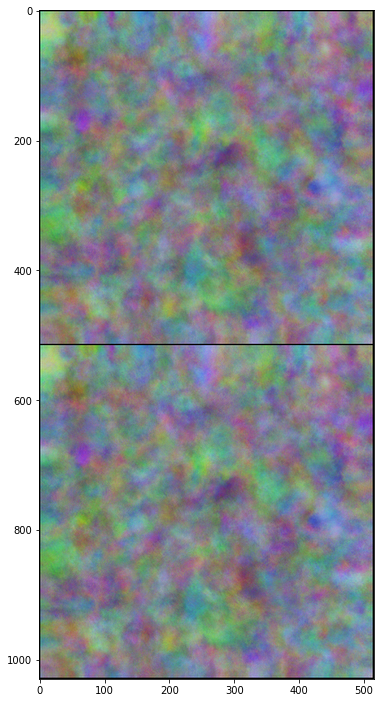

0 runtime: 1646863234.2186728
Iteration 00000    Loss 0.085147   PSNR_noisy: 10.698284   PSRN_gt: 11.151306 PSNR_gt_sm: 11.151306


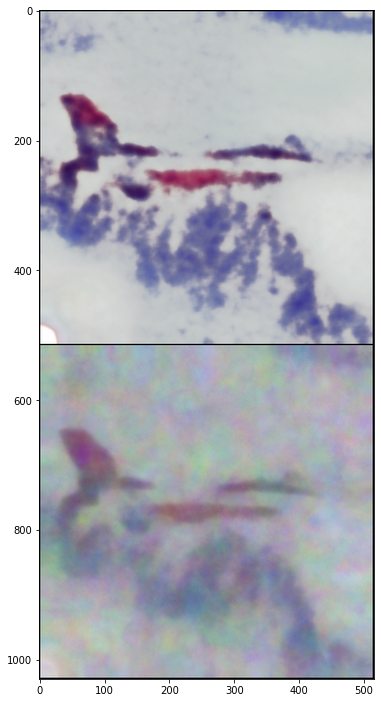

100 runtime: 15.643594741821289
Iteration 00100    Loss 0.017416   PSNR_noisy: 17.590527   PSRN_gt: 20.779440 PSNR_gt_sm: 16.852181


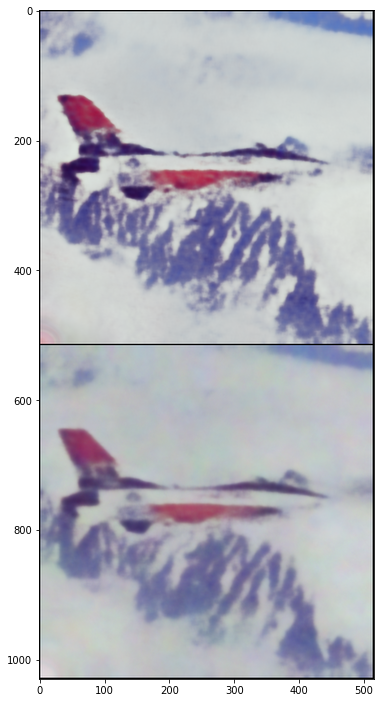

200 runtime: 31.39147710800171
Iteration 00200    Loss 0.014530   PSNR_noisy: 18.377448   PSRN_gt: 22.643576 PSNR_gt_sm: 21.105248


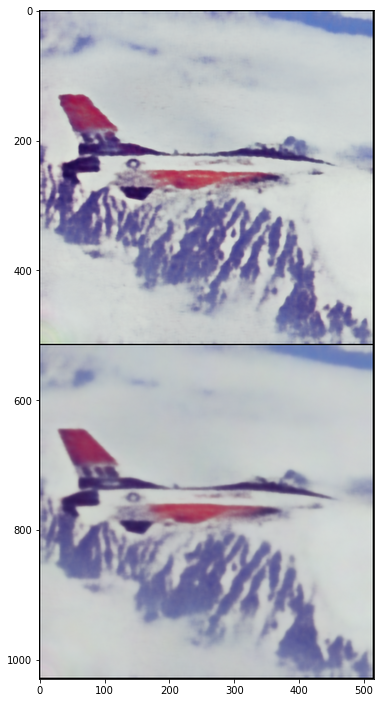

300 runtime: 47.127995014190674
Iteration 00300    Loss 0.013235   PSNR_noisy: 18.782771   PSRN_gt: 23.806715 PSNR_gt_sm: 23.522179


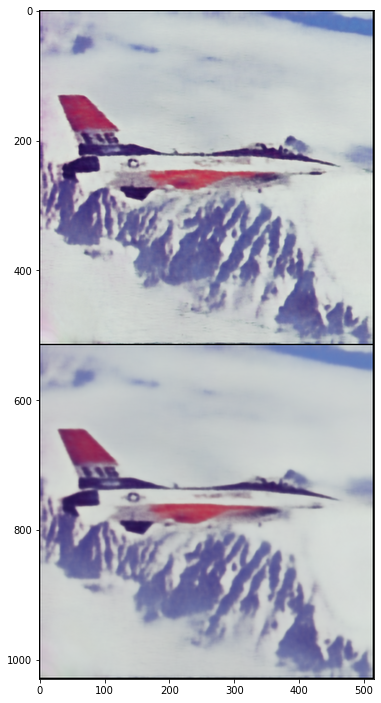

400 runtime: 62.85597038269043
Iteration 00400    Loss 0.012425   PSNR_noisy: 19.057209   PSRN_gt: 24.747792 PSNR_gt_sm: 24.964754


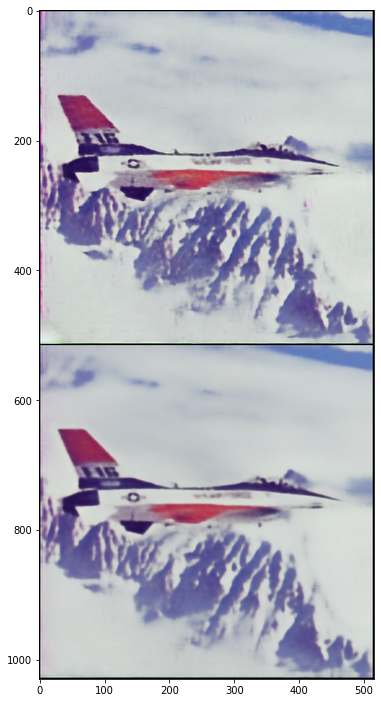

500 runtime: 78.61191153526306
Iteration 00500    Loss 0.011774   PSNR_noisy: 19.290894   PSRN_gt: 25.648854 PSNR_gt_sm: 26.202437


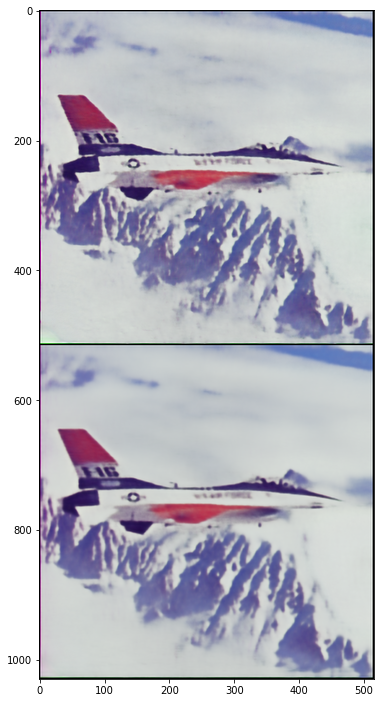

600 runtime: 94.38791012763977
Iteration 00600    Loss 0.011151   PSNR_noisy: 19.526702   PSRN_gt: 26.800719 PSNR_gt_sm: 27.535955


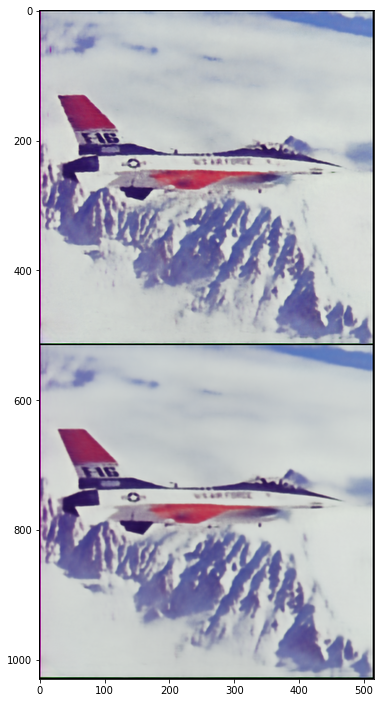

700 runtime: 110.16041898727417
Iteration 00700    Loss 0.010874   PSNR_noisy: 19.636158   PSRN_gt: 27.400239 PSNR_gt_sm: 28.447183


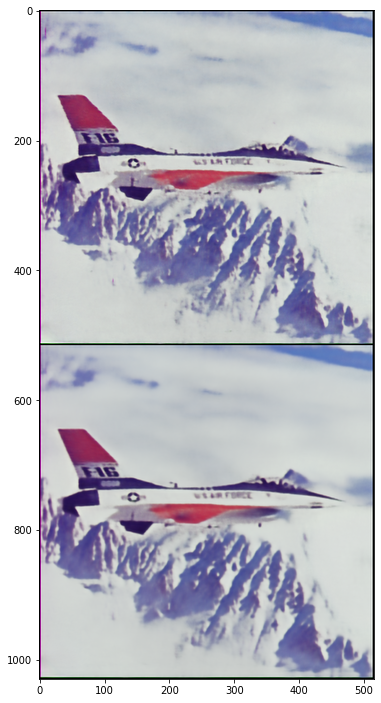

800 runtime: 125.94971966743469
Iteration 00800    Loss 0.010668   PSNR_noisy: 19.719027   PSRN_gt: 27.852339 PSNR_gt_sm: 29.068214


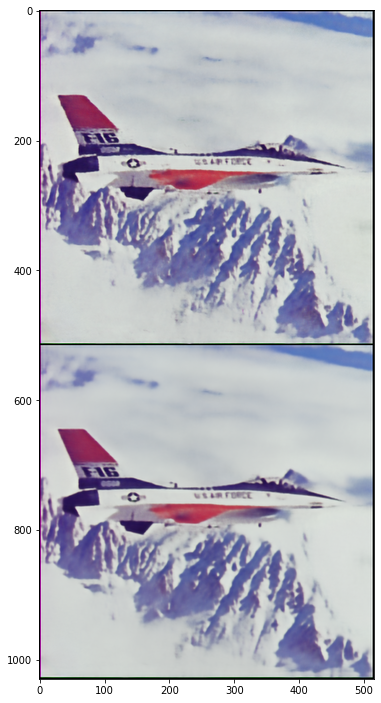

900 runtime: 141.67478036880493
Iteration 00900    Loss 0.010527   PSNR_noisy: 19.777054   PSRN_gt: 28.144857 PSNR_gt_sm: 29.572551


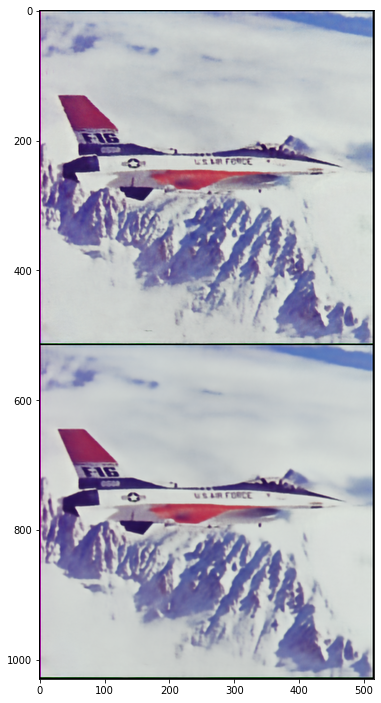

1000 runtime: 157.42971396446228
Iteration 01000    Loss 0.010392   PSNR_noisy: 19.833164   PSRN_gt: 28.489372 PSNR_gt_sm: 30.012772


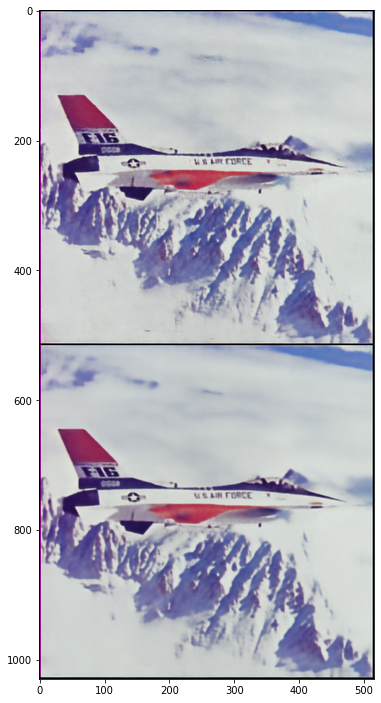

1100 runtime: 173.16779947280884
Iteration 01100    Loss 0.010265   PSNR_noisy: 19.886223   PSRN_gt: 28.852151 PSNR_gt_sm: 30.390417


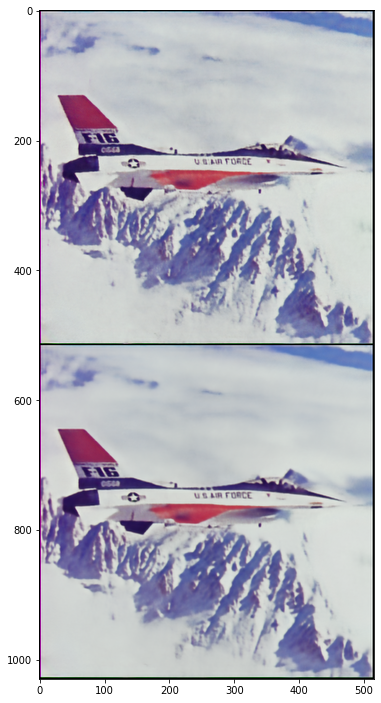

1200 runtime: 189.13763165473938
Iteration 01200    Loss 0.010162   PSNR_noisy: 19.930352   PSRN_gt: 29.138057 PSNR_gt_sm: 30.761817


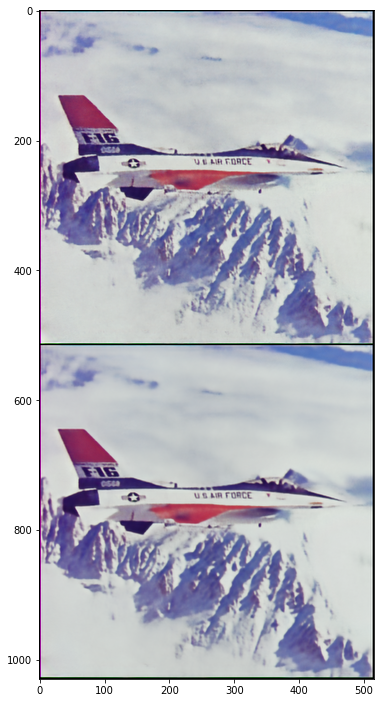

1300 runtime: 205.05405569076538
Iteration 01300    Loss 0.010101   PSNR_noisy: 19.956289   PSRN_gt: 29.238685 PSNR_gt_sm: 31.091363


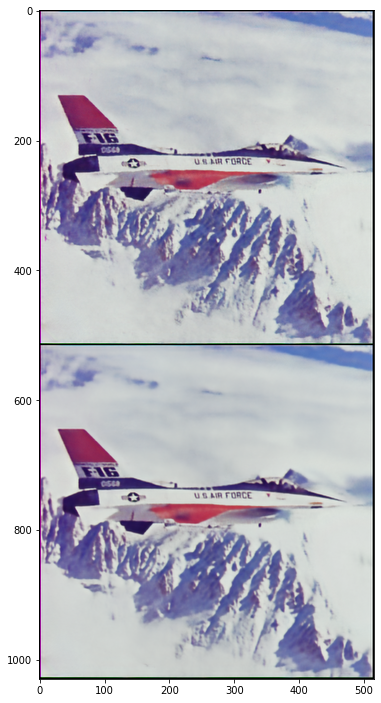

1400 runtime: 220.91112780570984
Iteration 01400    Loss 0.009983   PSNR_noisy: 20.007458   PSRN_gt: 29.582799 PSNR_gt_sm: 31.392145


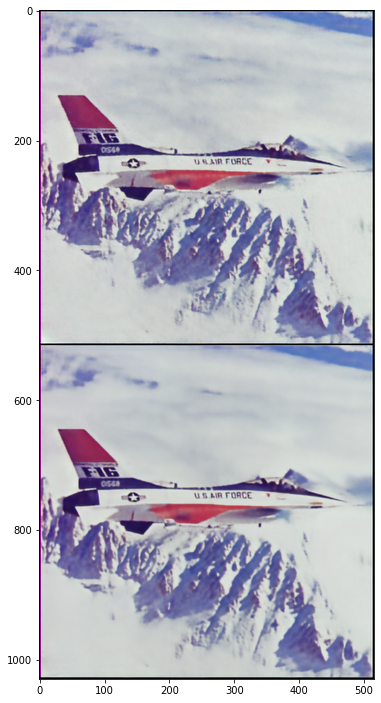

1500 runtime: 236.68363785743713
Iteration 01500    Loss 0.009906   PSNR_noisy: 20.041197   PSRN_gt: 29.816165 PSNR_gt_sm: 31.641561


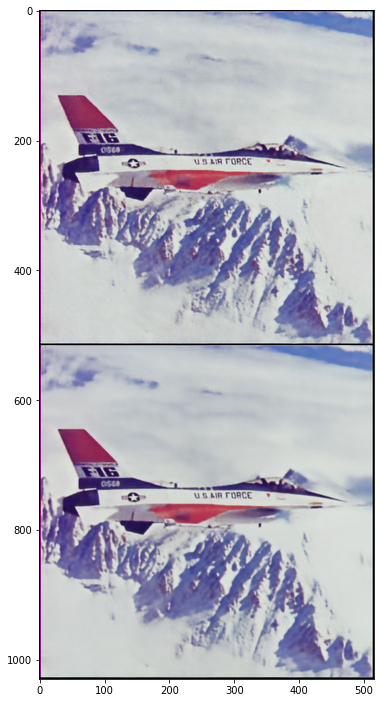

1600 runtime: 252.44084811210632
Iteration 01600    Loss 0.009838   PSNR_noisy: 20.070766   PSRN_gt: 29.936762 PSNR_gt_sm: 31.870030


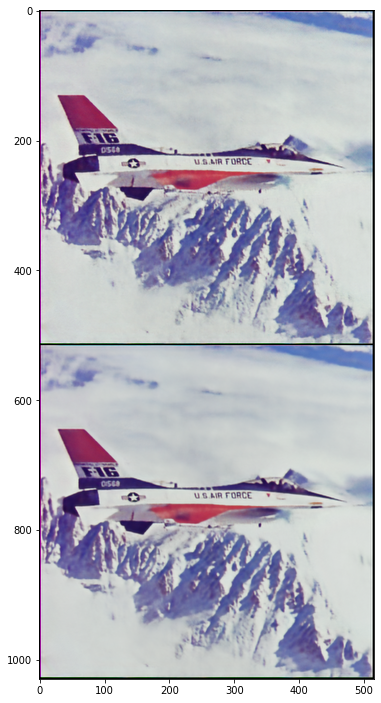

1700 runtime: 268.21134090423584
Iteration 01700    Loss 0.009772   PSNR_noisy: 20.100057   PSRN_gt: 30.167693 PSNR_gt_sm: 32.056351


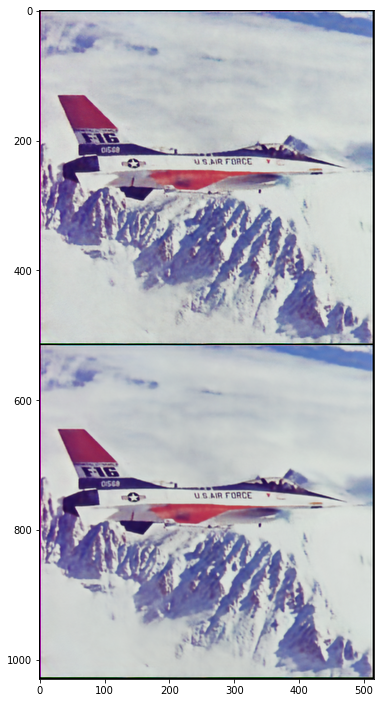

1800 runtime: 283.99458479881287
Iteration 01800    Loss 0.009705   PSNR_noisy: 20.129858   PSRN_gt: 30.284268 PSNR_gt_sm: 32.208363


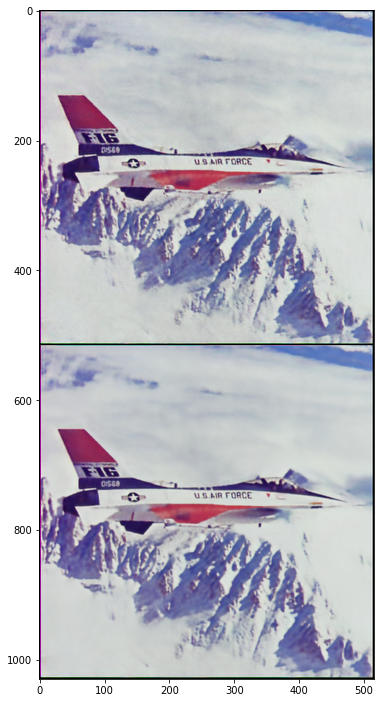

1900 runtime: 299.7878108024597
Iteration 01900    Loss 0.009667   PSNR_noisy: 20.147077   PSRN_gt: 30.304392 PSNR_gt_sm: 32.328794


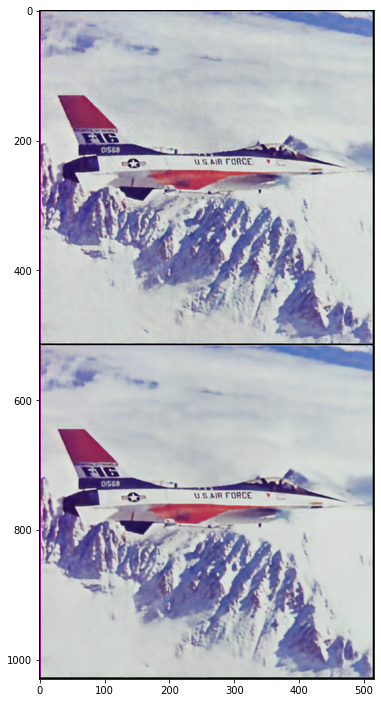

2000 runtime: 315.5862879753113
Iteration 02000    Loss 0.009568   PSNR_noisy: 20.191580   PSRN_gt: 30.544560 PSNR_gt_sm: 32.428986


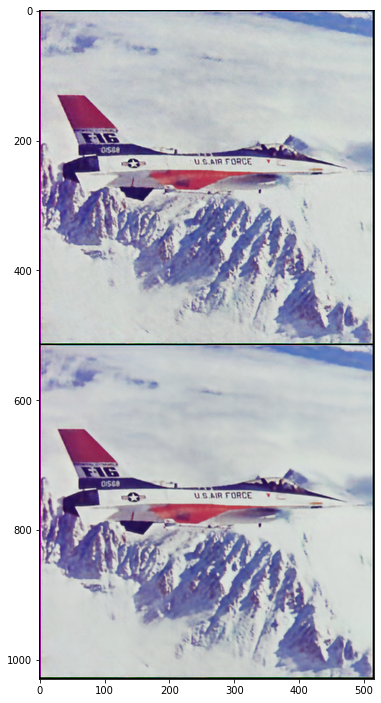

2100 runtime: 331.4073705673218
Iteration 02100    Loss 0.009551   PSNR_noisy: 20.199654   PSRN_gt: 30.430901 PSNR_gt_sm: 32.511331


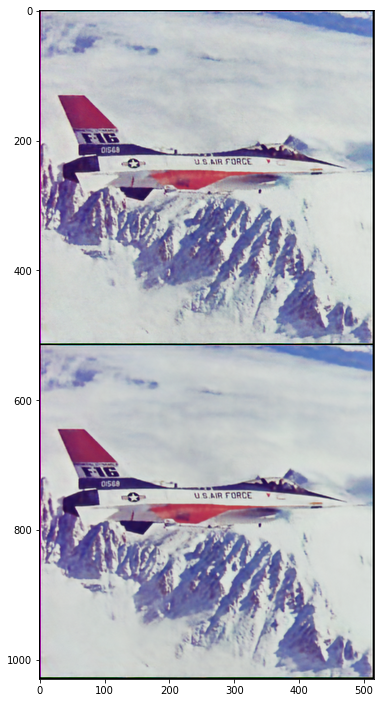

2200 runtime: 347.0259003639221
Iteration 02200    Loss 0.009522   PSNR_noisy: 20.212766   PSRN_gt: 30.447778 PSNR_gt_sm: 32.566402


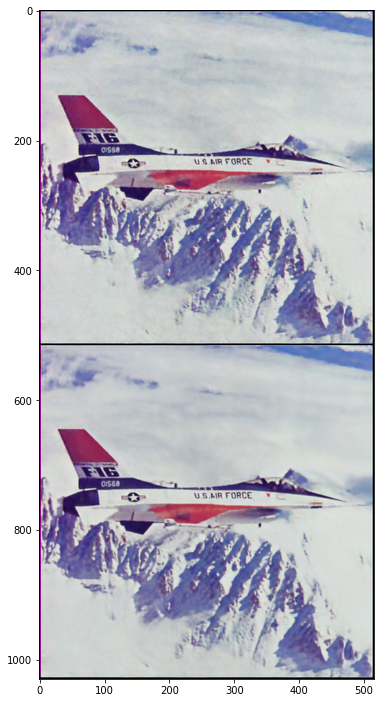

2300 runtime: 362.6935179233551
Iteration 02300    Loss 0.009439   PSNR_noisy: 20.250803   PSRN_gt: 30.582340 PSNR_gt_sm: 32.594922


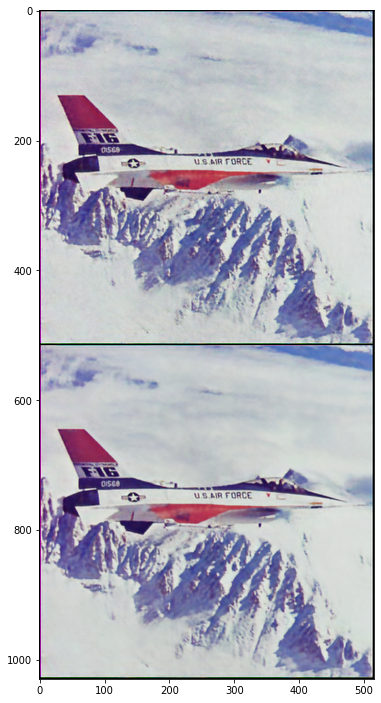

2400 runtime: 378.52646684646606
Iteration 02400    Loss 0.009383   PSNR_noisy: 20.276649   PSRN_gt: 30.561563 PSNR_gt_sm: 32.609162


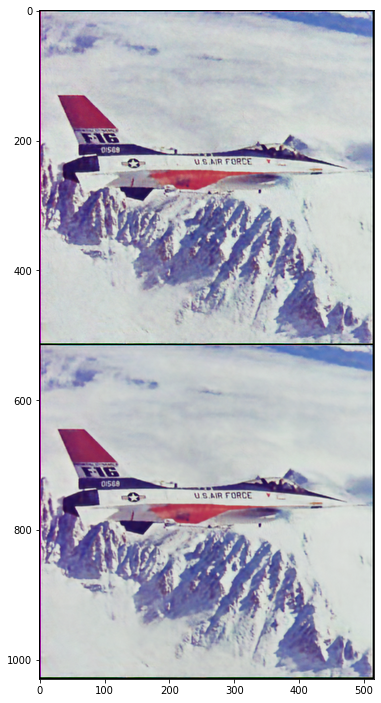

2500 runtime: 394.2733311653137
Iteration 02500    Loss 0.009348   PSNR_noisy: 20.292745   PSRN_gt: 30.484323 PSNR_gt_sm: 32.598178


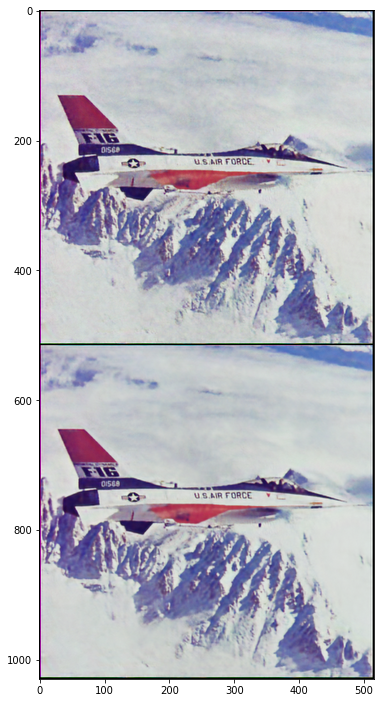

2600 runtime: 409.79047417640686
Iteration 02600    Loss 0.009296   PSNR_noisy: 20.316848   PSRN_gt: 30.471691 PSNR_gt_sm: 32.569531


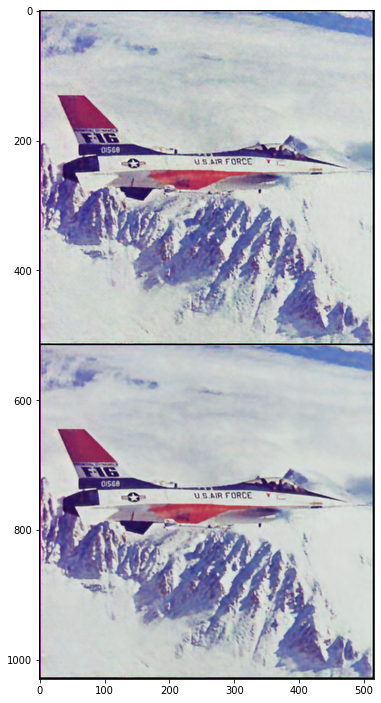

2700 runtime: 425.28671383857727
Iteration 02700    Loss 0.009258   PSNR_noisy: 20.334842   PSRN_gt: 30.341270 PSNR_gt_sm: 32.525149


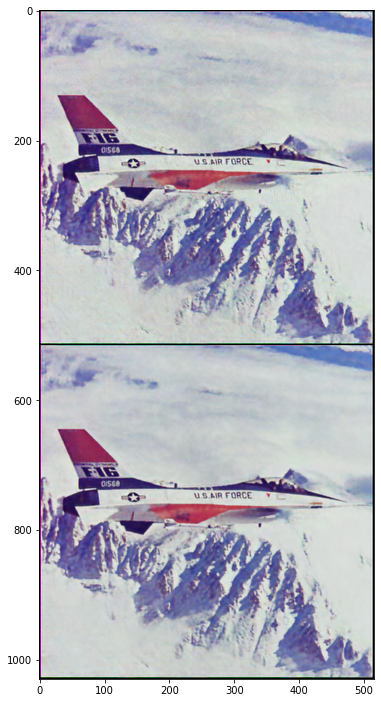

2800 runtime: 440.7781271934509
Iteration 02800    Loss 0.009240   PSNR_noisy: 20.343476   PSRN_gt: 30.195181 PSNR_gt_sm: 32.467971


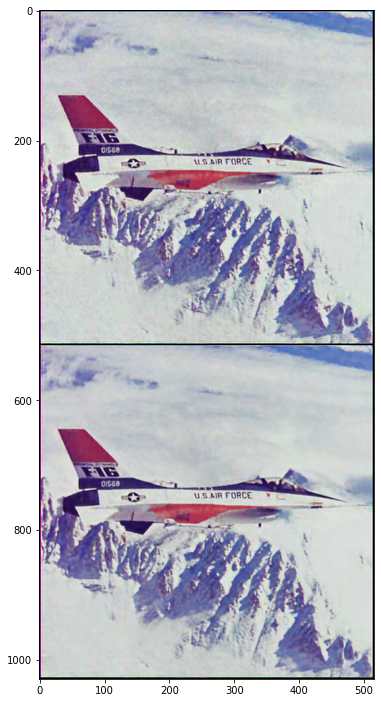

2900 runtime: 456.2964267730713
Iteration 02900    Loss 0.009153   PSNR_noisy: 20.384249   PSRN_gt: 30.160040 PSNR_gt_sm: 32.388494


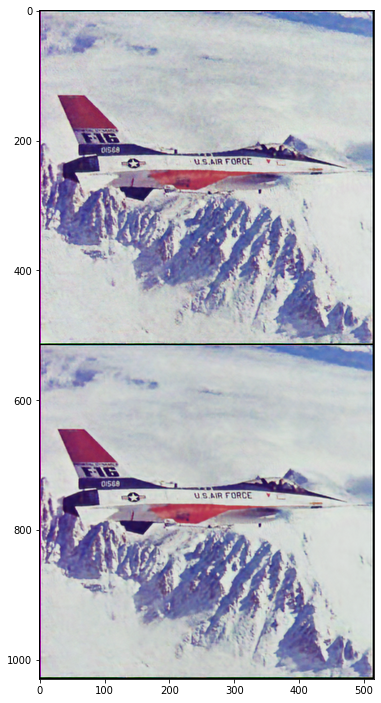

3000 runtime: 471.78417015075684
Iteration 03000    Loss 0.009164   PSNR_noisy: 20.378989   PSRN_gt: 29.881582 PSNR_gt_sm: 32.292152


In [ ]:
net_input_saved = net_input.detach().clone()
print(net_input_saved)
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0

filename_noisy = 'psnr_noisy_dip1.txt'
filename_gt = 'psnr_gt_dip1.txt'
filename_gt_sm = 'psnr_gt_sm_dip1.txt'
filename_loss = 'total_loss_dip1.txt'
optimal_psnr_gt = 0
optimal_psnr_gt_sm = 0
optimal_time_gt = 0
optimal_time_gt_sm = 0
optimal_i_gt = 0
optimal_i_gt_sm = 0

start = 0
i = 0
def closure():
    
    global i, out_avg, psrn_noisy_last, last_net, net_input, filename_gt_sm, filename_gt, filename_loss, filename_noisy, start
    global optimal_psnr_gt, optimal_psnr_gt_sm, optimal_time_gt, optimal_time_gt_sm, optimal_i_gt, optimal_i_gt_sm

    # time
    if (i == 1):
      start = time.time()

    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
            
    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()
        
    
    psrn_noisy = peak_signal_noise_ratio(img_noisy_np, out.detach().cpu().numpy()[0]) 
    psrn_gt    = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0]) 
    psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0]) 

    
    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
        
        # psrn_noise, psrn_gt, psrn_gt_sm, loss curve
        with open(filename_noisy, 'a') as f:
          f.write(str(psrn_noisy)+"\t")
          #f.write("\t")
        with open(filename_gt, 'a') as f:
          f.write(str(psrn_gt)+"\t")
          #f.write("\t")
        with open(filename_gt_sm, 'a') as f:
          f.write(str(psrn_gt_sm)+"\t")
          #f.write("\t")
        with open(filename_loss, 'a') as f:
          f.write(str(total_loss.item())+"\t")
          #f.write("\t")
        print(i, "runtime:", time.time() - start)
        print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm))

        if (psrn_gt >= optimal_psnr_gt):
          optimal_psnr_gt = psrn_gt
          optimal_time_gt = time.time() - start
          optimal_i_gt = i
          img_gt = np_to_pil(out_np)
          img_gt.save("optimal_gt_dip.png")

        if (psrn_gt_sm >= optimal_psnr_gt_sm):
          optimal_psnr_gt_sm = psrn_gt_sm
          optimal_time_gt_sm = time.time() - start
          optimal_i_gt_sm = i
          img_gt_sm = np_to_pil(out_np)
          img_gt_sm.save("optimal_gt_sm_dip.png")

        
        
    
    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5: 
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy
            
    i += 1
    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


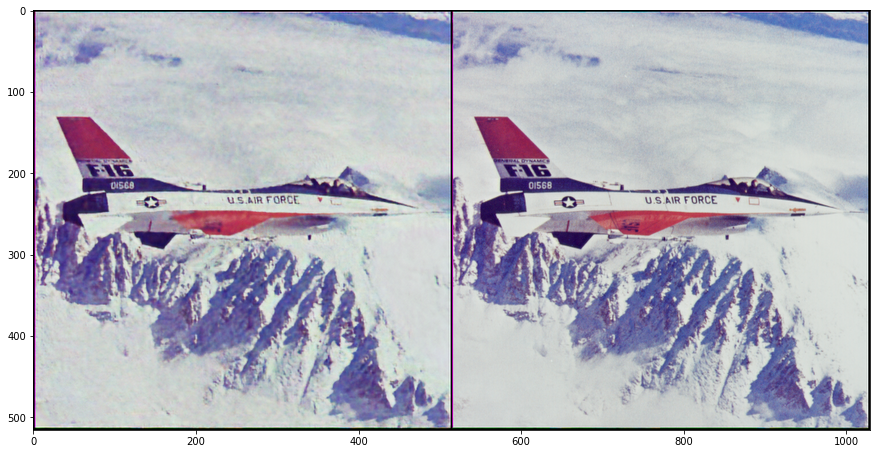

In [ ]:
out_np = torch_to_np(net(net_input))
q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=13);

In [ ]:
print("optimal gt:")
print("runtime: {}".format(optimal_time_gt), "iteration: {}".format(optimal_i_gt), "psnr: {}".format(optimal_psnr_gt))

print("optimal gt sm:")
print("runtime: {}".format(optimal_time_gt_sm), "iteration: {}".format(optimal_i_gt_sm), "psnr sm: {}".format(optimal_psnr_gt_sm))

optimal gt:
runtime: 362.69443917274475 iteration: 2300 psnr: 30.582339706197427
optimal gt sm:
runtime: 378.52670097351074 iteration: 2400 psnr sm: 32.60916169814712
